В этом файле содержится краткий отчёт о проделанной работе. Основной код написан на С++ и находится в файле main.cpp в той же директории. Все используемые изображения находятся в папке images. Директория bash_build предназаначена для сборки через cmake. CMakeLists.txt так же лежит в этой же директории.

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import cv2

Для начала продемонстрирую работу написаного кода. Есть 2 режима: просто демозаикинг (на случай если оригинала нет) и демозаикинг с последующим сравнением с оригиналом. Запустим просто демозаикинг на паре картинок, которые удалось найти на просторах Интернета. Для этого я запускала следующие команды **из директории bash_build:**

cmake ..

cmake --build .

./task_1 ../images/Raw_bayer.png ../images/from_raw_bayer.png

./task_1 ../images/jen-bayerized.jpg ../images/from_jen-bayerized.jpg

У меня получилось время работы: 

Время работы алгоритма в секундах: 0.019333

Время работы алгоритма в секундах: 0.013953

Это вполне нормально: картинки достаточно маленькие.

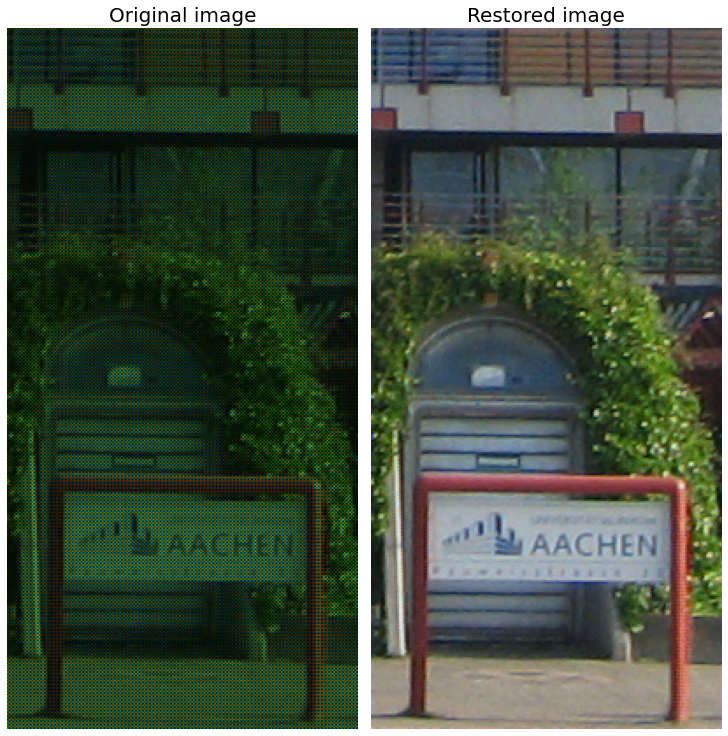

In [3]:
img1_or = cv2.imread("images/Raw_bayer.png")
img1_or = cv2.cvtColor(img1_or, cv2.COLOR_BGR2RGB)
img1_tr = cv2.imread("images/from_raw_bayer.png")
img1_tr = cv2.cvtColor(img1_tr, cv2.COLOR_BGR2RGB)
fig, axs = plt.subplots(1, 2, constrained_layout=True, 
                                figsize = (10, 10))
axs[0].axis("off")
axs[0].set_title("Original image", fontsize = 20)
axs[0].imshow(img1_or);
axs[1].axis("off")
axs[1].set_title("Restored image", fontsize = 20)
axs[1].imshow(img1_tr);

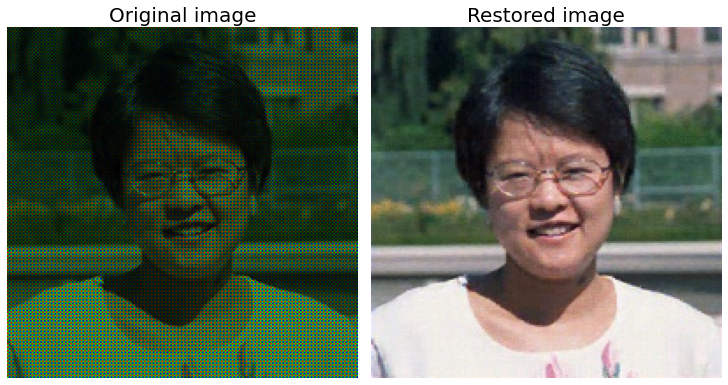

In [4]:
img2_or = cv2.imread("images/jen-bayerized.jpg")
img2_or = cv2.cvtColor(img2_or, cv2.COLOR_BGR2RGB)
img2_tr = cv2.imread("images/from_jen-bayerized.jpg")
img2_tr = cv2.cvtColor(img2_tr, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 2, constrained_layout=True, 
                                figsize = (10, 10))
axs[0].axis("off")
axs[0].set_title("Original image", fontsize = 20)
axs[0].imshow(img2_or);
axs[1].axis("off")
axs[1].set_title("Restored image", fontsize = 20)
axs[1].imshow(img2_tr);

Посчитаем время работы в секундах на мегапиксель:

In [5]:
t1 = 0.019333
mpixels1 = (img1_or.size / 3) / (10**6)
t1_work = t1 / mpixels1
print('t1_work = ', t1_work, 'c/M')
t2 = 0.013953
mpixels2 = (img2_or.size / 3) / (10**6)
t2_work = t2 / mpixels2
print('t2_work = ', t2_work, 'c/M')

t1_work =  0.2416625 c/M
t2_work =  0.348825 c/M


Время получилось разным. Замечу, что 2-ая картинка меньше и могут сказываться эффекты от постоянных копирований и сравнений.

Теперь перейдём к основному изображению. Чтобы запустить режим со сравнением достаточно в конце дописать название файла с оригиналом. НО если оригинал не совпадёт по размеру или типу с исходным изображением, то программа **не только не сравнит изображения, но и вообще не сделает ничего**. Это сделано намеренно: если работа завершается исключением, значит вызов был некорректен и мы не должны были испортить исходные данные. В том числе мы не должны были перезаписать выходной файл.
Запускаем:

./task_1 ../images/RGB_CFA.bmp ../images/CFA_restored.bmp ../images/Original.bmp

Получаем

Время работы алгоритма в секундах: 0.973268

PSNR = 24.9184

PSNR служит мерой разницы между оригиналом и изображением, полученным с помощью демозаикинга. Для 8-битного изображения это вполне хороший результат, сопостовимый с помехами при передаче по сети. 

Снова пересчитаем время работы:

In [6]:
img_tr = cv2.imread("images/CFA_restored.bmp")
img_tr = cv2.cvtColor(img_tr, cv2.COLOR_BGR2RGB)
t = 0.973268
mpixels = (img_tr.size / 3) / (10**6)
t_work = t / mpixels
print('t_work = ', t_work, 'c/M')

t_work =  0.11242752558436973 c/M


Стало даже ещё лучше, но меня это начинает смущать. Признаю, что я замеряю именно время работы самого алгоритма. Т. е. паддинг и копирование перед выполнением, а так же побрезка и копирование после выполнения не попадпют в часть кода, на которой я засекала время. 

Не хотелось бы кого-либо обнадёживать, поэтому время работы я просто усредню:

In [7]:
print('Итоговое среднее время работы = ', np.mean([t1_work, t2_work, t_work]), 
     'c/M')

Итоговое среднее время работы =  0.23430500852812328 c/M


**Характеристики системы:**

Получена командой sudo lshw -short

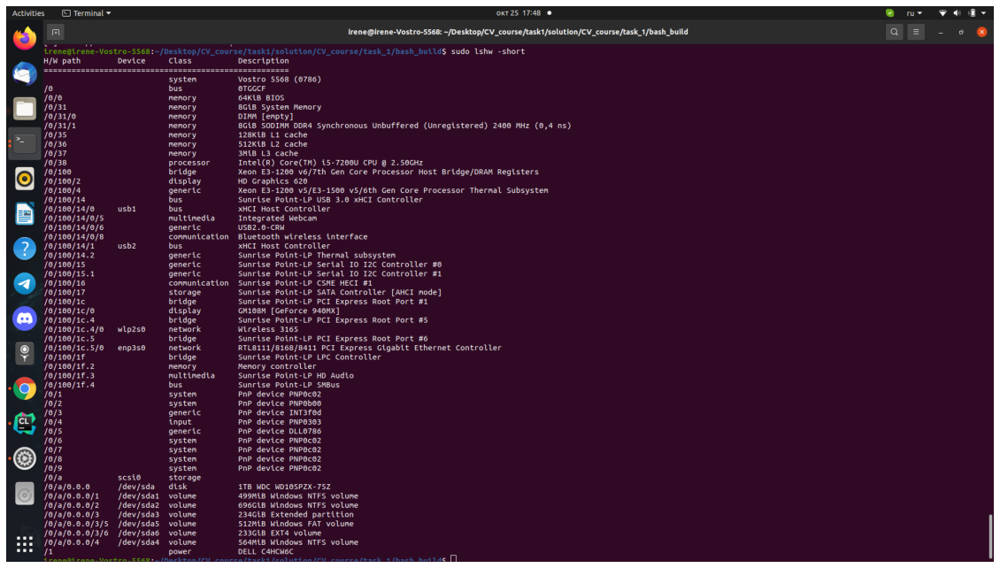

In [10]:
img_info = cv2.imread("system_info.png")
img_info = cv2.cvtColor(img_info, cv2.COLOR_BGR2RGB)
fig = plt.figure(figsize=(20,20))
plt.axis("off")
plt.imshow(img_info)

Теперь посмотрим на получившееся изображение и оригинал

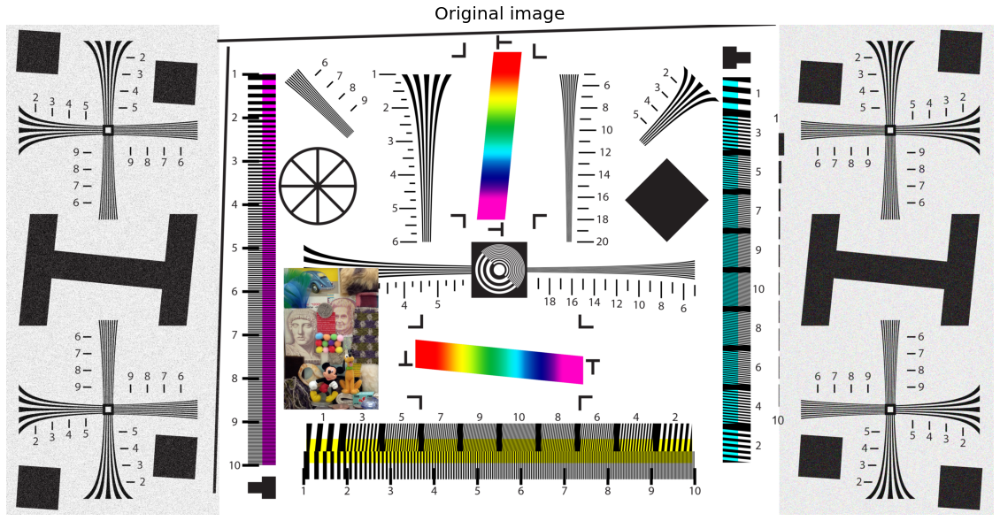

In [11]:
img_or = cv2.imread("images/Original.bmp")
img_or = cv2.cvtColor(img_or, cv2.COLOR_BGR2RGB)
fig = plt.figure(figsize=(20,20))
plt.axis("off")
plt.title("Original image", fontsize = 20)
plt.imshow(img_or);

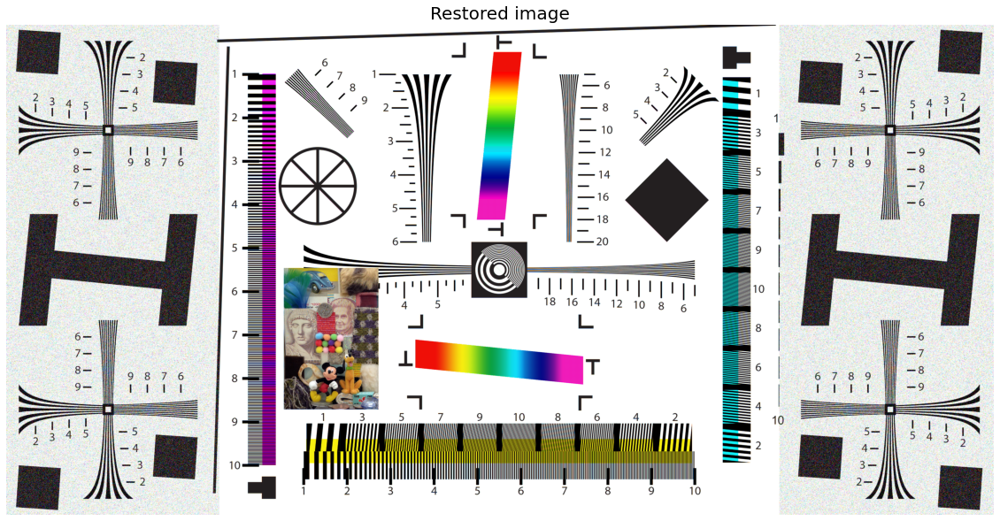

In [12]:
fig = plt.figure(figsize=(20,20))
plt.axis("off")
plt.title("Restored image", fontsize = 20)
plt.imshow(img_tr);

Вышло похоже. Считать полосы для определения снижения разрешения вручную будет сложно. Поэтому я выделю наиболее интересные части изображения и построю их яркость - так я смогу проверить, различимы полосы или нет.

In [14]:
n, m, channels = img_tr.shape
red_r = np.zeros([n, m])
green_r = np.zeros([n, m])
blue_r = np.zeros([n, m])
red = np.zeros([n, m])
green = np.zeros([n, m])
blue = np.zeros([n, m])

# Поменяли порядок каналов у всех открытых изображений на R, G, B
for i in range(n):
    for j in range(m):
        red_r[i, j], green_r[i, j], blue_r[i, j] = img_tr[i, j]
        red[i, j], green[i, j], blue[i, j] = img_or[i, j]

In [15]:
def lumience_r(y, x): 
    return 0.299 * red_r[y, x] + 0.587 * green_r[y, x] + 0.114 * blue_r[y, x]

def lumience(y, x):
    return 0.299 * red[y, x] + 0.587 * green[y, x] + 0.114 * blue[y, x]

In [38]:
def plot_lumience(top_y, bottom_y, left_x, right_x):
    """Функция чтобы выделить на картинке прямоугольники и отобразить 
    яркость в них. Принимает списки параметров для отображения нескольких 
    прямоугольников"""
    
    top_y = np.array(top_y)
    bottom_y = np.array(bottom_y)
    left_x = np.array(left_x)
    right_x = np.array(right_x)
    
    n = len(top_y)
    if (len(bottom_y) != n) and (len(left_x) != n) and (len(right_x) != n):
        raise CustomException("wrong arrays size in plot_lumience")
        
    fig, ax = plt.subplots(figsize=(20,20))
    plt.axis("off")
    plt.title("Восстановленное изображение с отмеченными прямоугольниками", 
              fontsize = 20)
    box_kwargs = dict(linewidth=2, fill=False, edgecolor='red', 
                      facecolor='none')
    bbox = dict(facecolor='none', edgecolor='none')
    annot_kwargs = dict(color='red', size=18, bbox=bbox)
    
    for i in range(n):
        box_patch = Rectangle(
            (left_x[i], top_y[i]), 
            width = right_x[i] - left_x[i], height = bottom_y[i] - top_y[i], 
            **box_kwargs
        )
        ax.add_patch(box_patch)
        plt.text(left_x[i], top_y[i], str(i + 1), **annot_kwargs)
        
    plt.imshow(img_tr);
    
    for i in range(n):
        y, x = np.meshgrid(
            np.linspace(top_y[i], bottom_y[i], bottom_y[i] - top_y[i])
            .astype(int),
            np.linspace(left_x[i], right_x[i], right_x[i] - left_x[i])
            .astype(int)
        )
        z = lumience_r(y, x)
        z2 = lumience(y, x)
    
        fig, axs = plt.subplots(2, 1, constrained_layout=True, 
                                figsize = (20, 20))
        cont1 = axs[0].contourf(y, x, z, cmap = "Blues")
        cont2 = axs[1].contourf(y, x, z2, cmap = "Blues")

        axs[0].set_title(
            "Яркость для восстановленного изображения в прямоугольнике " \
            + str(i + 1), fontsize = 20)
        axs[1].set_title("Яркость для оригинала в прямоугольнике " \
            + str(i + 1), fontsize = 20)
        axs[0].tick_params(axis='both', which='major', labelsize = 20)
        axs[1].tick_params(axis='both', which='major', labelsize = 20)
    
        cbar1 = fig.colorbar(cont1, ax = axs[0])
        cbar2 = fig.colorbar(cont2, ax = axs[1])
        cbar1.ax.tick_params(labelsize = 20)
        cbar2.ax.tick_params(labelsize = 20)
        plt.show()

Cначала посмотрим на края: 4 группы полос на зашумлённых частях.

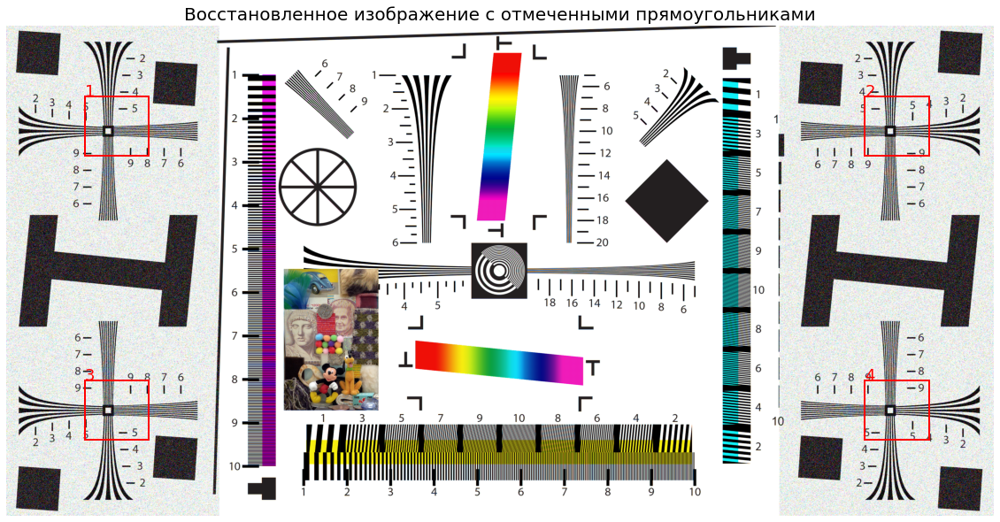

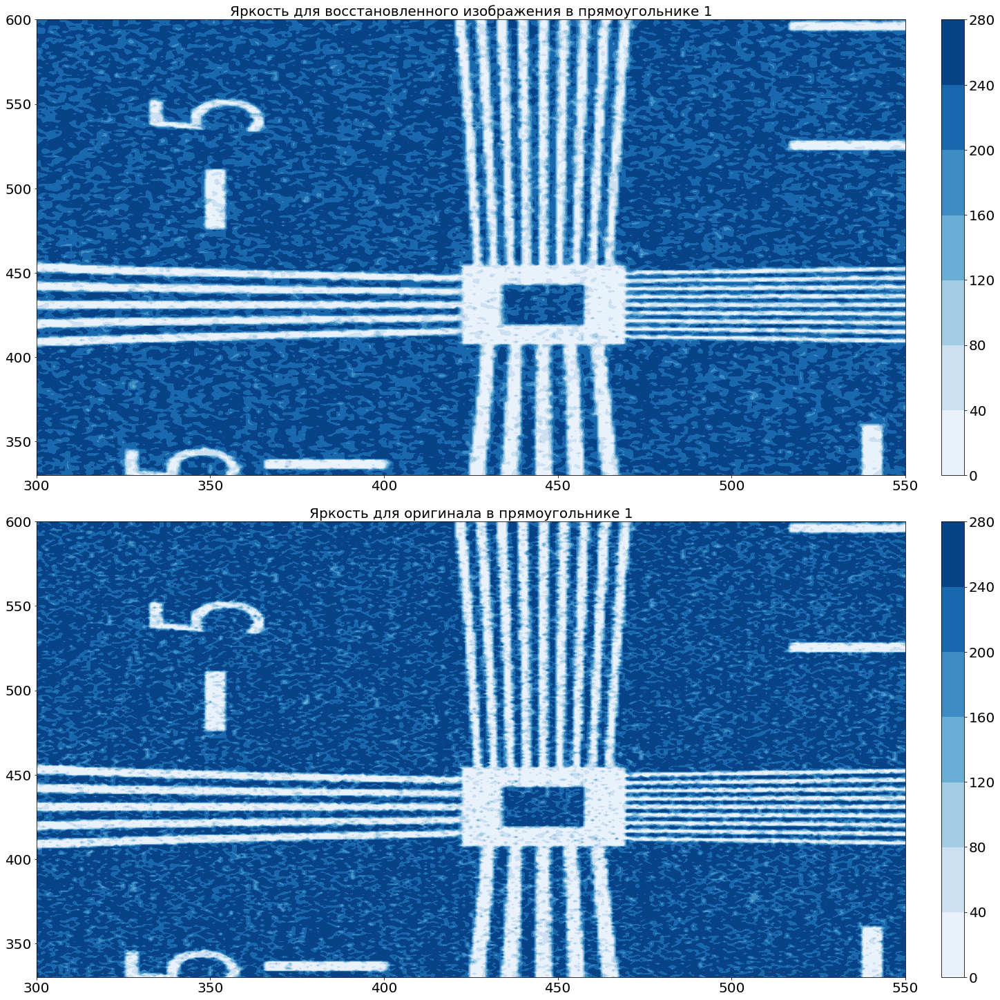

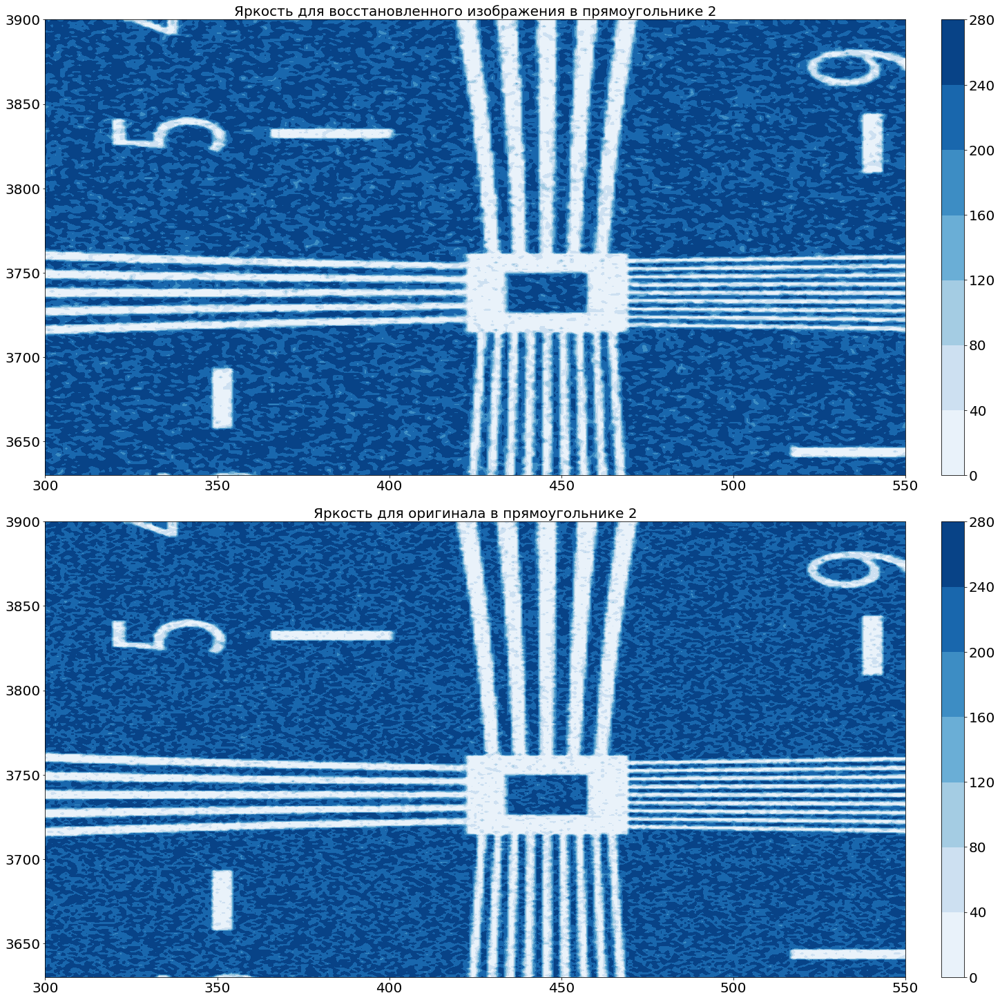

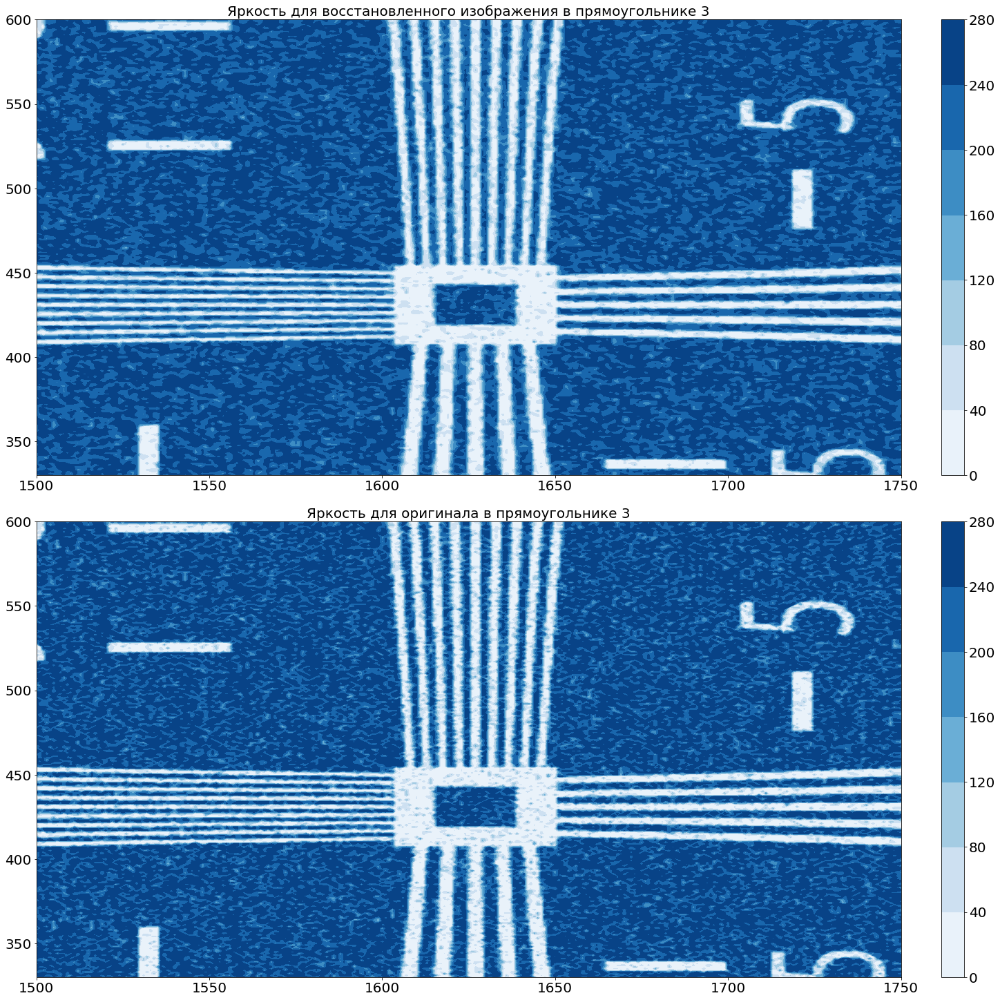

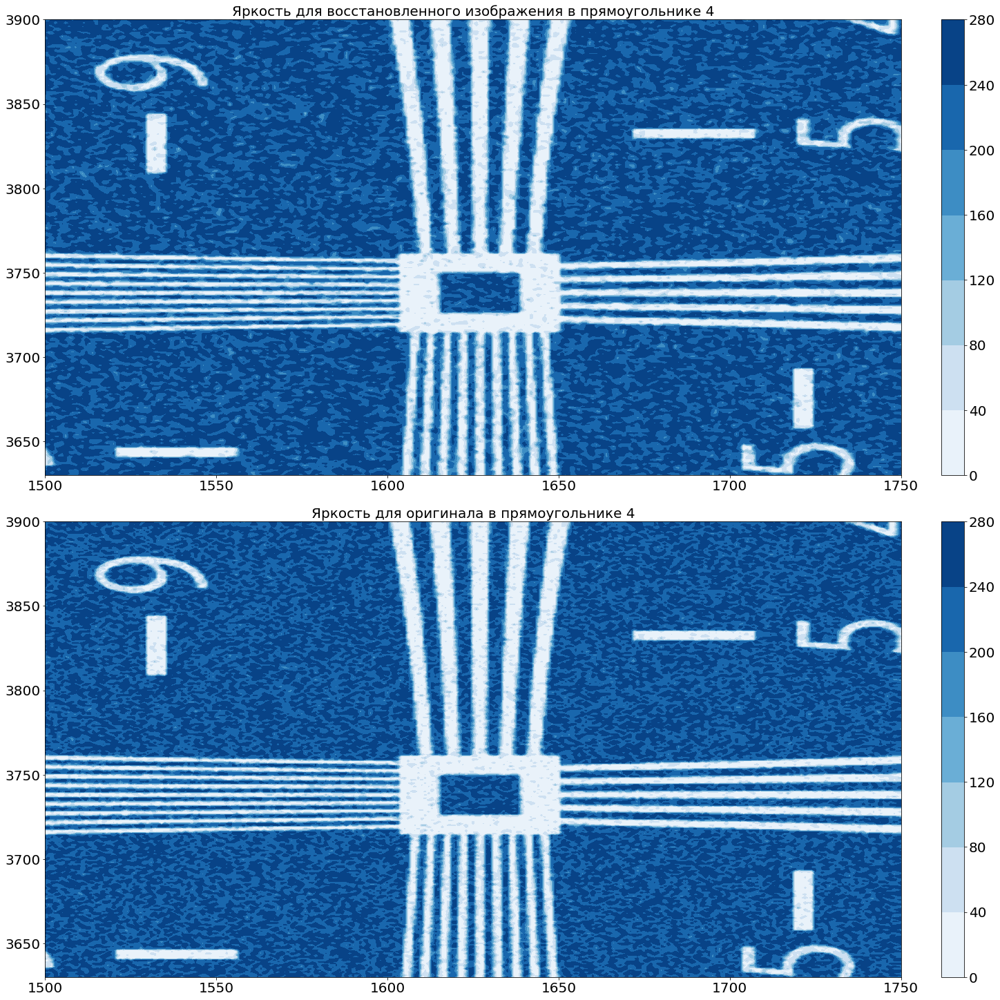

In [23]:
plot_lumience(
    top_y = [300, 300, 1500, 1500],
    bottom_y = [550, 550, 1750, 1750],
    left_x = [330, 3630, 330, 3630], 
    right_x = [600, 3900, 600, 3900]
    )

Надо признать, что с поворотом возникли некоторые проблемы. Так что все графики повёрнуты относительно выделенных на изображении прямоугольников на 90 градусов **против часовой стрелки**. Тем не менее я могу различить все линии и больше не буду задерживаться на данных частях изображения.

Теперь смотрим на 2 группы косых полос в верхней части посередине:

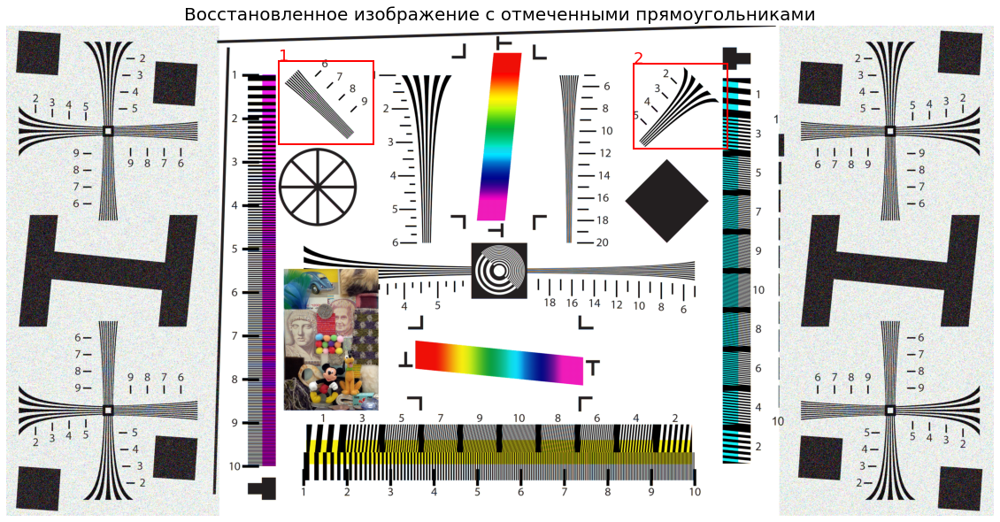

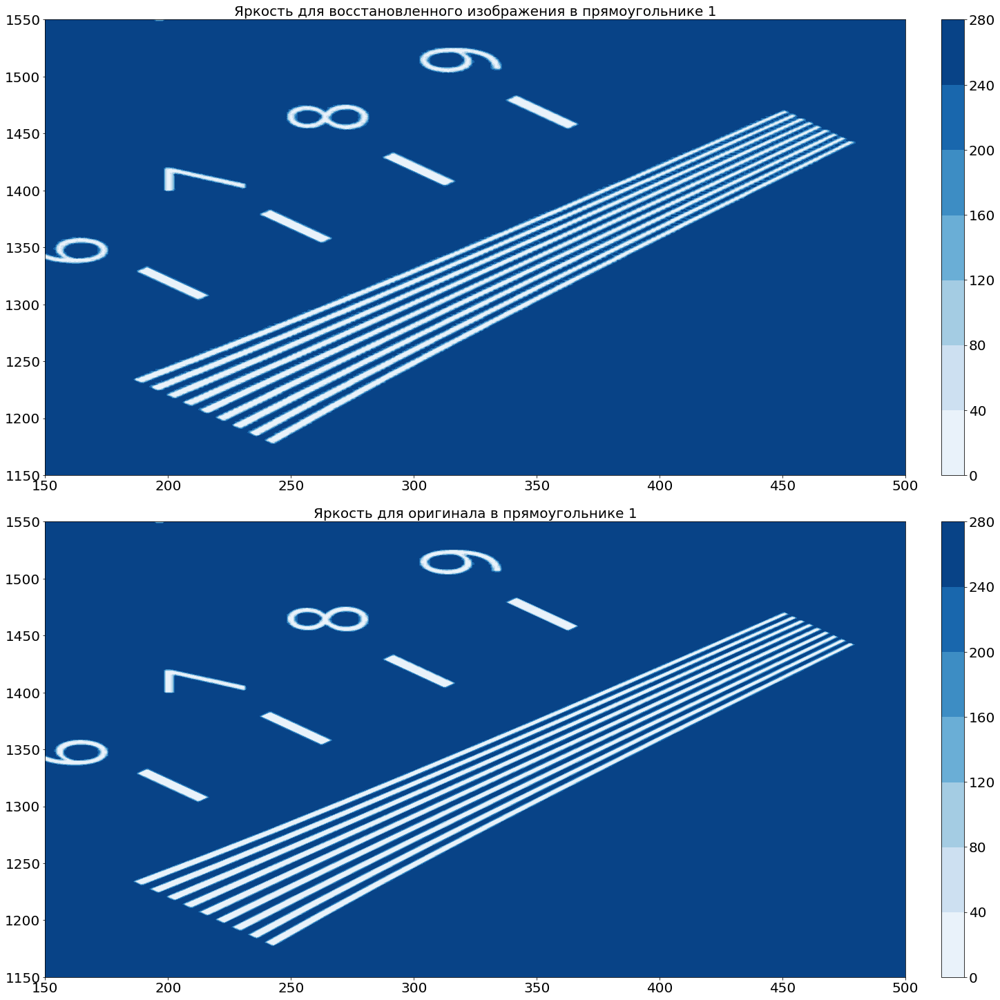

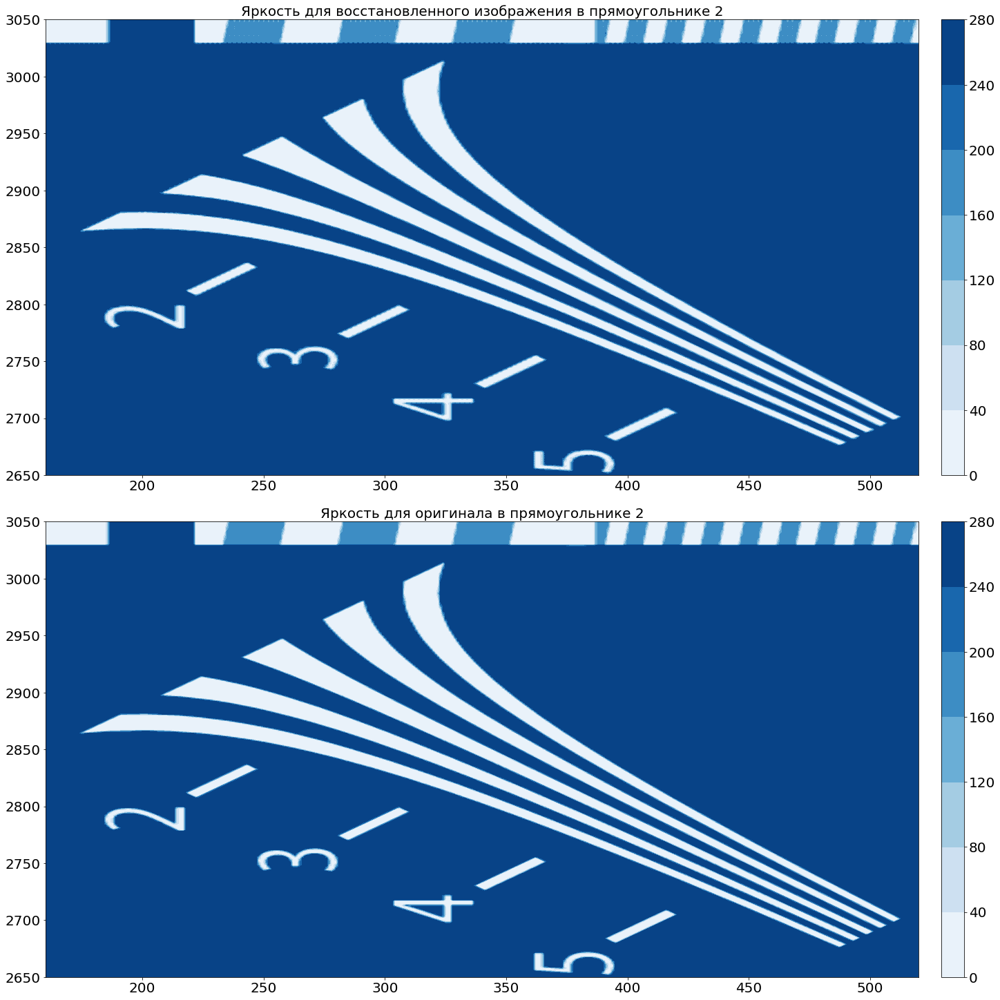

In [27]:
plot_lumience(
    top_y = [150, 160],
    bottom_y = [500, 520],
    left_x = [1150, 2650], 
    right_x = [1550, 3050],
    )

Первая группа на восстановленном изображении уже вызывает некоторые вопросы. Появляется неприятная глазу рябь, в то время как на оригинале всё вполне чисто и аккуратно. Пока я всё же могу назвать точное число полос. Второая группа более разреженная и к ней вопросов нет.

Теперь 2 вертикальные группы у центра изображения.

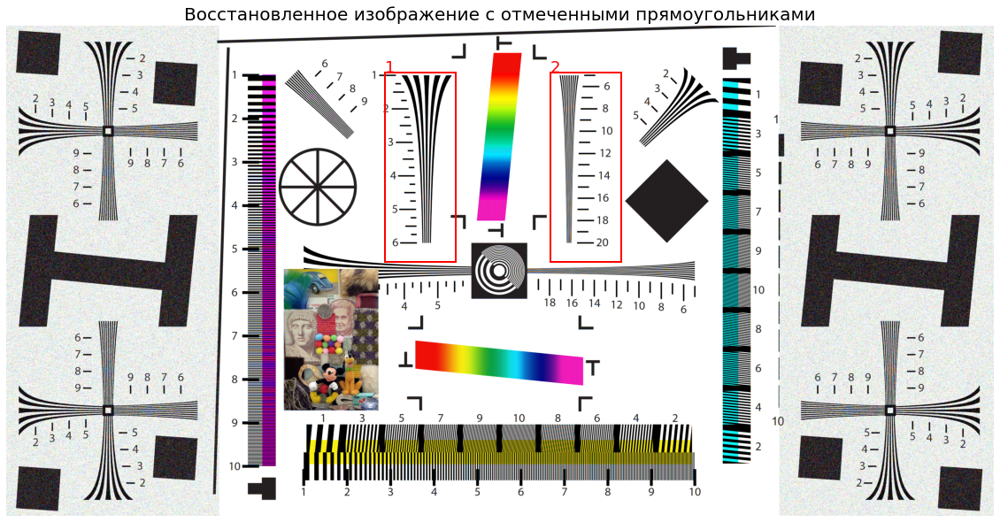

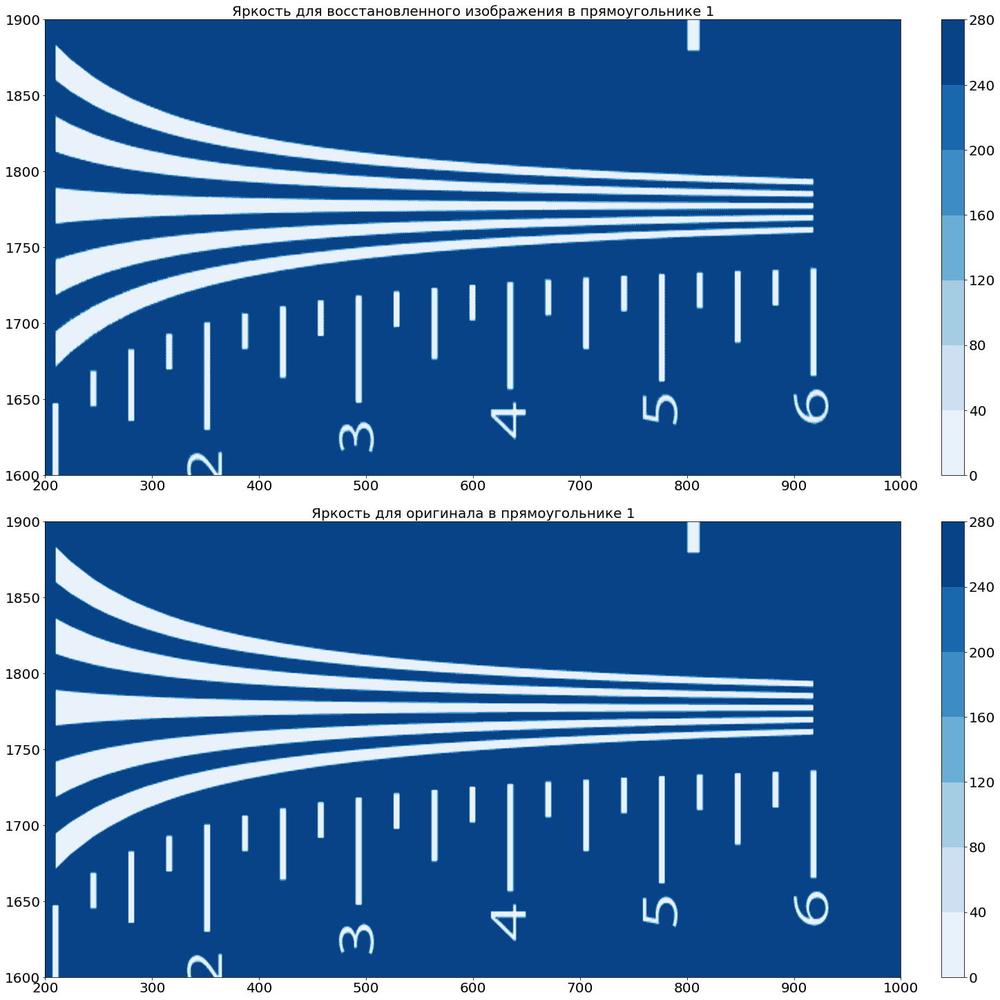

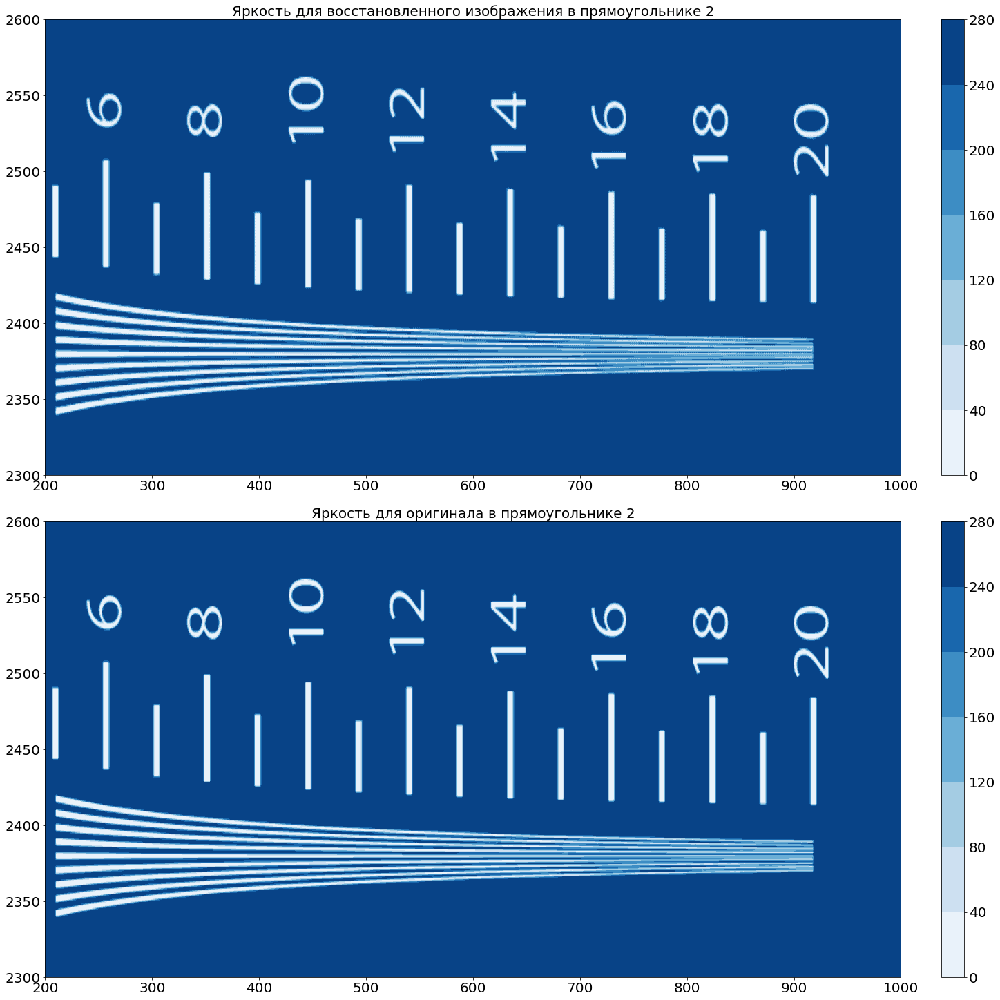

In [40]:
plot_lumience(
    top_y = [200, 200],
    bottom_y = [1000, 1000],
    left_x = [1600, 2300], 
    right_x = [1900, 2600],
    )

В первой группе всё видно и в оригинале и в восстановленном изображении. Вторая группа, видимо, будет для меня одной из основных в определении разрешения. На восстановленном изображении различия между полосами теряются в районе отметки 13, что соответствует разрешению 1300, а на оригинале - в районе отметки 15, что соответствует разрешению 1500. Но пока рассмотрены далеко не все направления.

Теперь буду заниматься конструкцией посередине. Уже понятно, что разрешения стоит искать между 1100 и 1700, поэтому прямоугольник будет сильно сдвинут вправо.

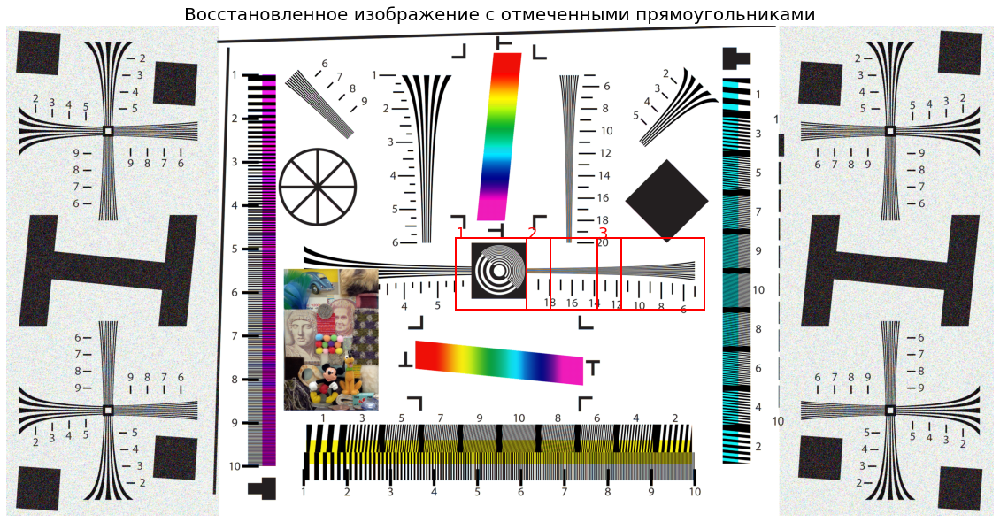

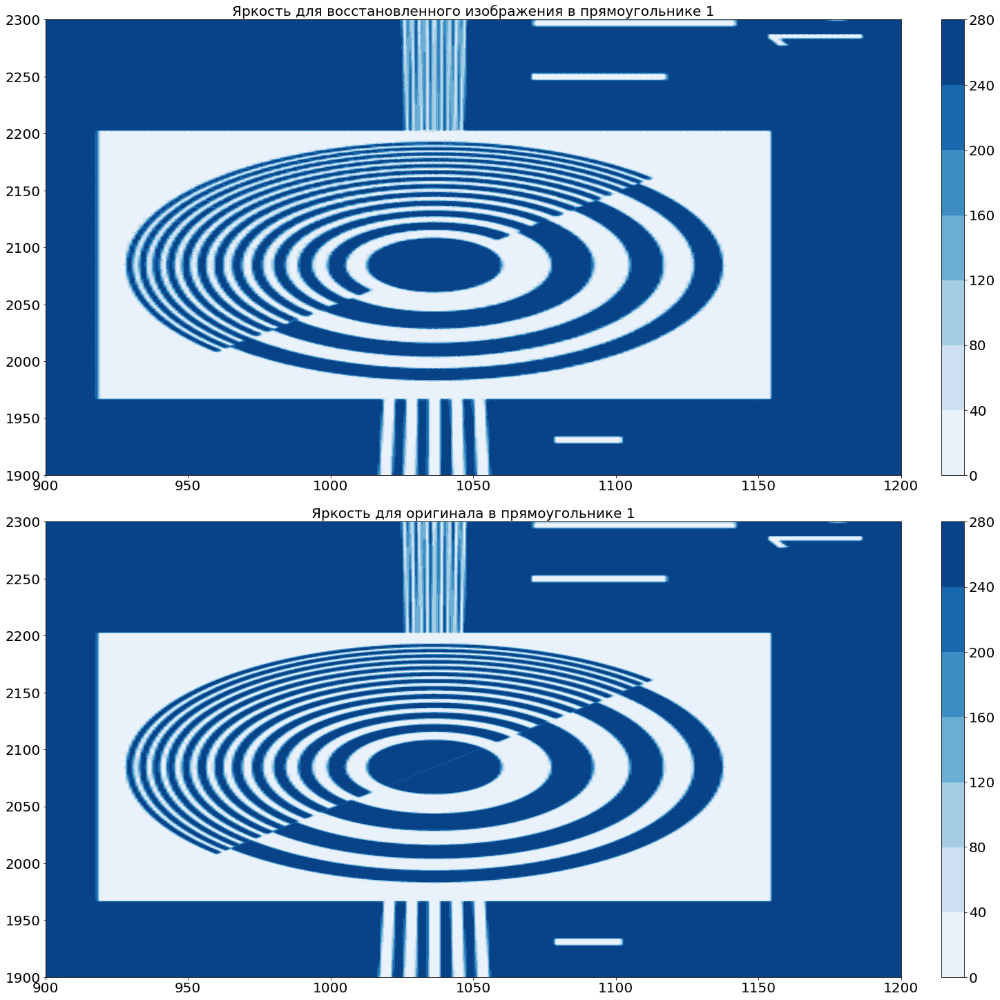

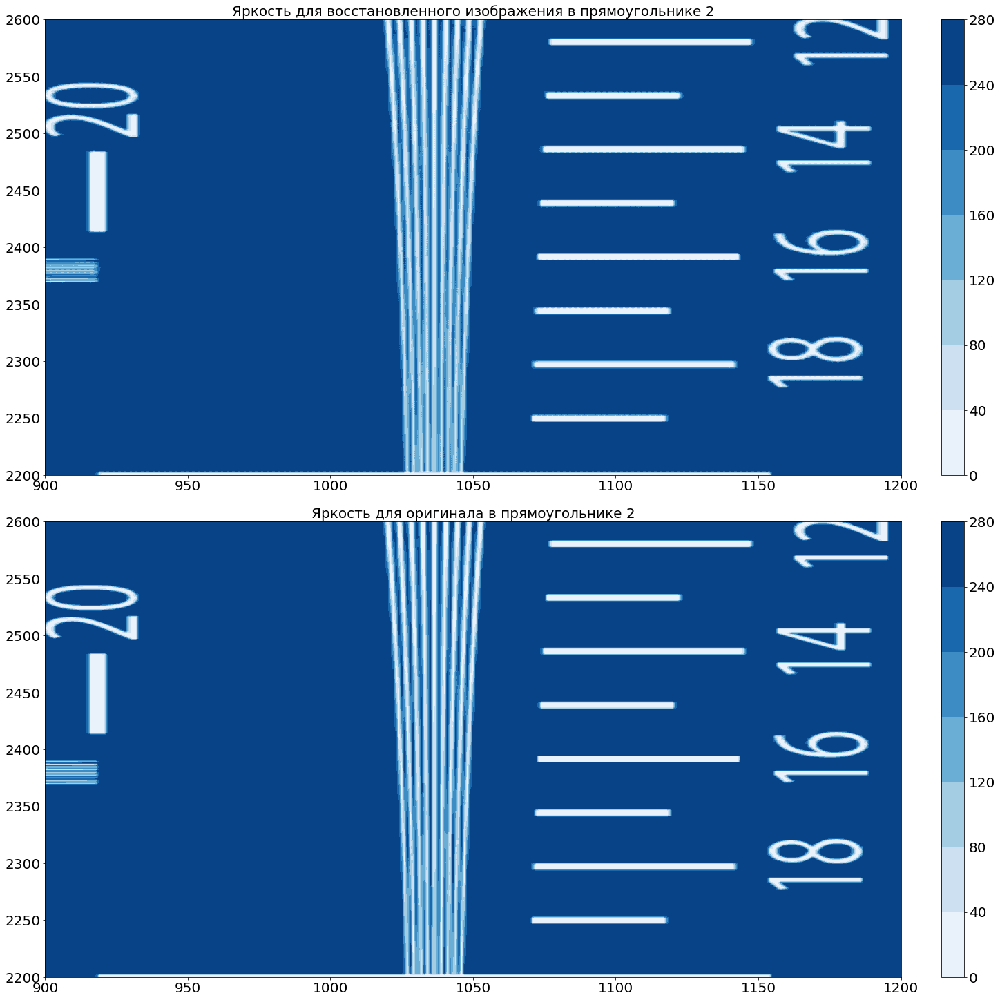

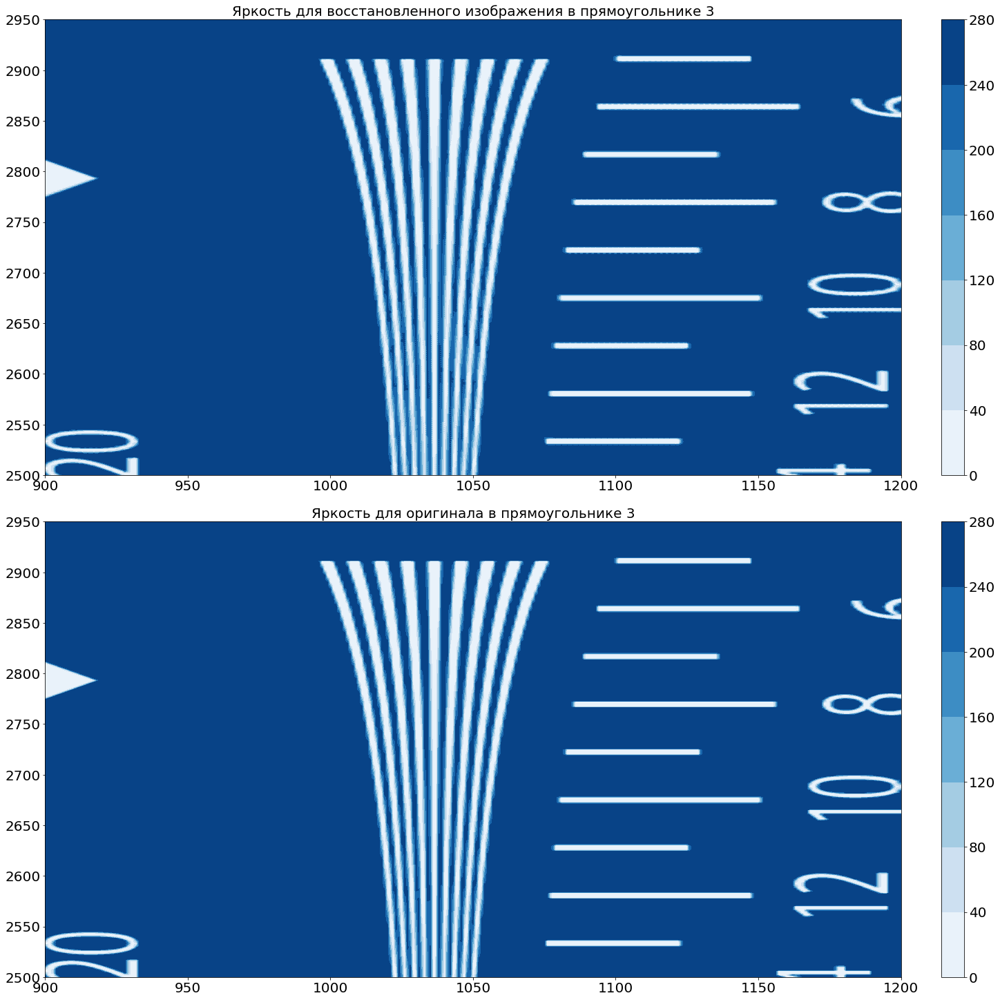

In [64]:
top_y  = [900, 900, 900]
bottom_y = [1200, 1200, 1200] 
left_x = [1900, 2200, 2500] 
right_x = [2300, 2600, 2950]

n = 3
fig, ax = plt.subplots(figsize=(20,20))
plt.axis("off")
plt.title("Восстановленное изображение с отмеченными прямоугольниками", 
              fontsize = 20)
box_kwargs = dict(linewidth=2, fill=False, edgecolor='red', 
                      facecolor='none')
bbox = dict(facecolor='none', edgecolor='none')
annot_kwargs = dict(color='red', size=18, bbox=bbox)
    
for i in range(n):
    box_patch = Rectangle((left_x[i], top_y[i]), 
            width = right_x[i] - left_x[i], height = bottom_y[i] - top_y[i], 
            **box_kwargs
    )
    ax.add_patch(box_patch)
    plt.text(left_x[i], top_y[i], str(i + 1), **annot_kwargs)
        
plt.imshow(img_tr)
        
for i in range(n):
    y, x = np.meshgrid(
        np.linspace(top_y[i], bottom_y[i], bottom_y[i] - top_y[i])
        .astype(int),
        np.linspace(left_x[i], right_x[i], right_x[i] - left_x[i])
        .astype(int)
    )
    z = lumience_r(y, x)
    z2 = lumience(y, x)
    
    fig, axs = plt.subplots(2, 1, constrained_layout=True, figsize = (20, 20))
    cont1 = axs[0].contourf(y, x, z, cmap = "Blues")
    cont2 = axs[1].contourf(y, x, z2, cmap = "Blues")

    axs[0].set_title(
        "Яркость для восстановленного изображения в прямоугольнике " \
            + str(i + 1), fontsize = 20)
    axs[1].set_title("Яркость для оригинала в прямоугольнике " \
            + str(i + 1), fontsize = 20)
    axs[0].tick_params(axis='both', which='major', labelsize = 20)
    axs[1].tick_params(axis='both', which='major', labelsize = 20)
    
    cbar1 = fig.colorbar(cont1, ax = axs[0])
    cbar2 = fig.colorbar(cont2, ax = axs[1])
    cbar1.ax.tick_params(labelsize = 20)
    cbar2.ax.tick_params(labelsize = 20)
    plt.show()

Мне пришлось разбить изображение на 3 части. 

В первом прямоугольнике:

    с окружностями всё в порядке, но различить линии не получается.
    
Во втором прямоугольнике:
    
    для оригинала линии начинают смешиваться на отметке 16, а для восстановленного изображения - на отметке 14.
    
В третьем прямоугольнике:

    уже всё ровно и линии различимы.


Две вертикальные линейки: сначала левая, потом правая.

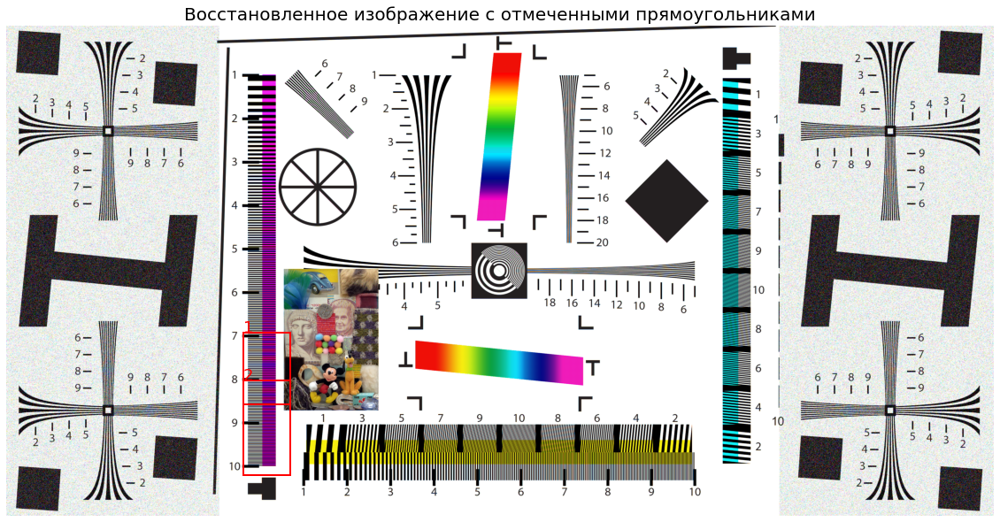

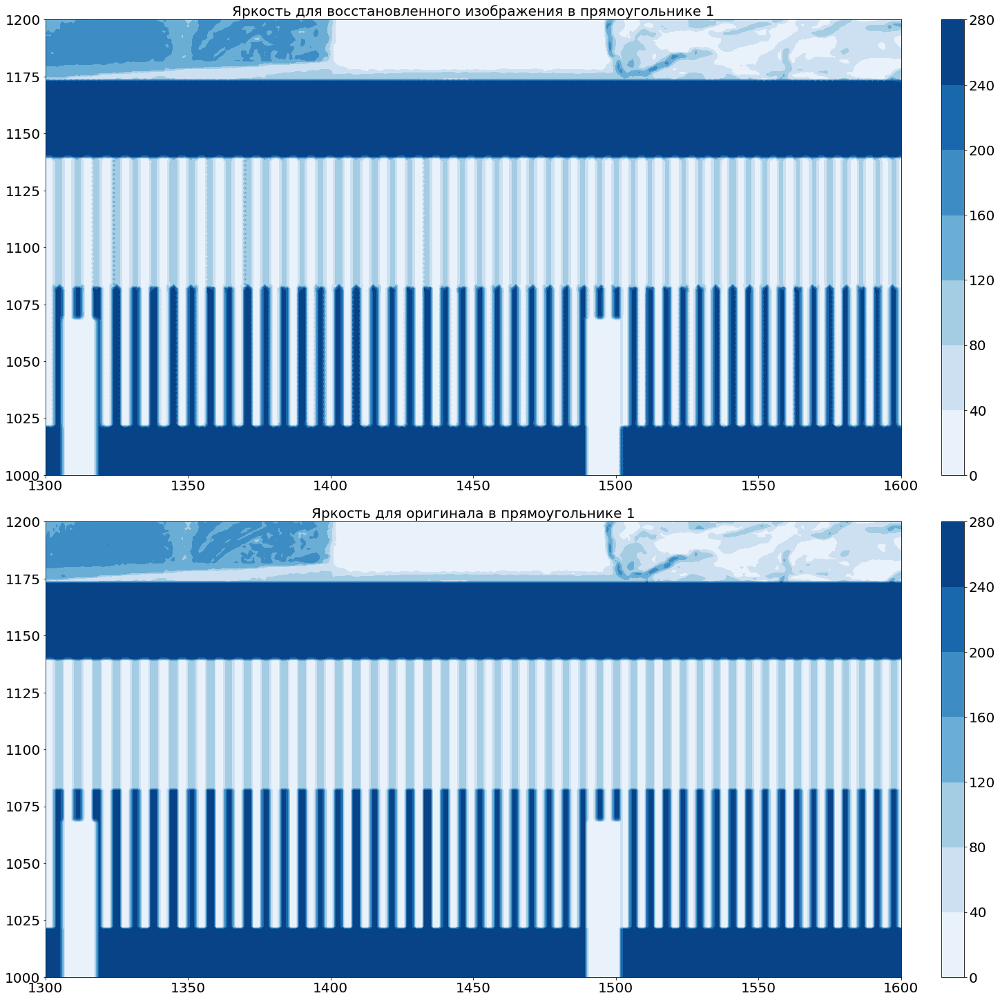

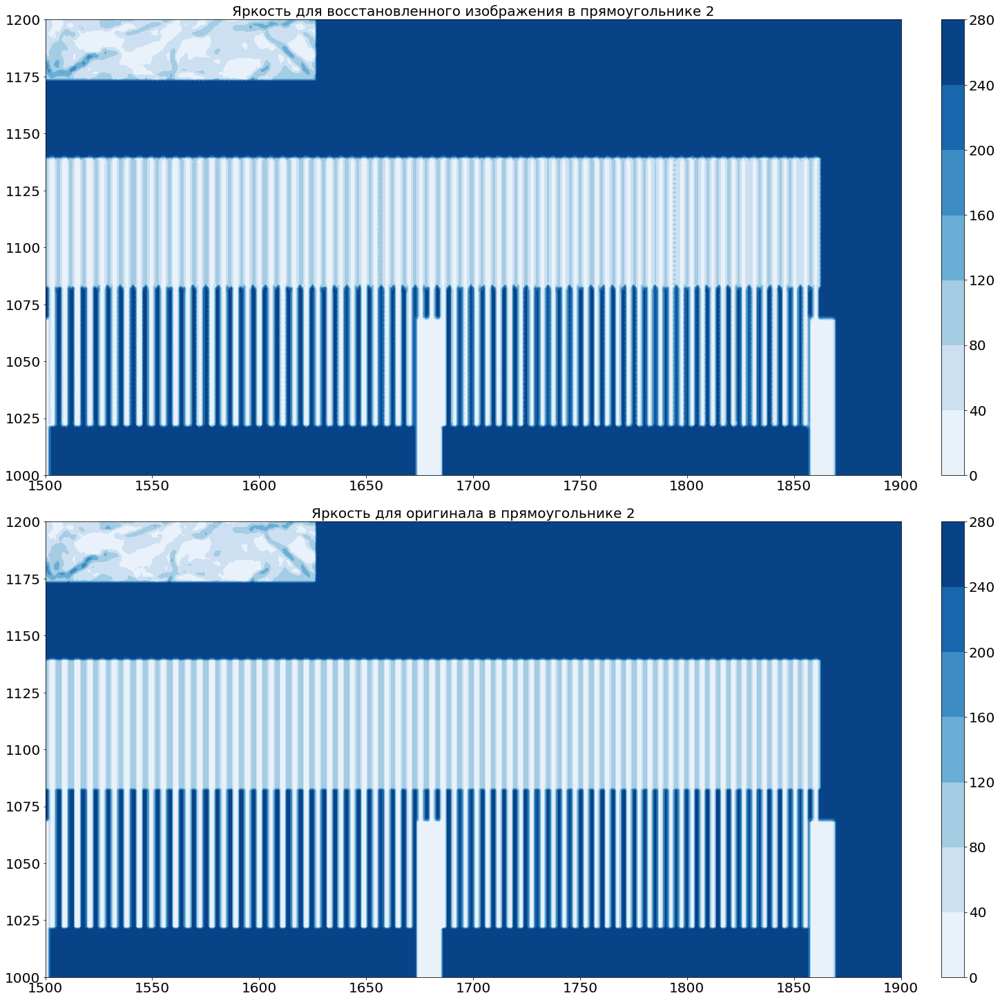

In [67]:
plot_lumience(top_y = [1300, 1500], 
              bottom_y = [1600, 1900], 
              left_x = [1000, 1000], 
              right_x = [1200, 1200])


На втором прямоугольнике пр 9.5 начинается некоторое размытие полос на фиолетовом фоне.

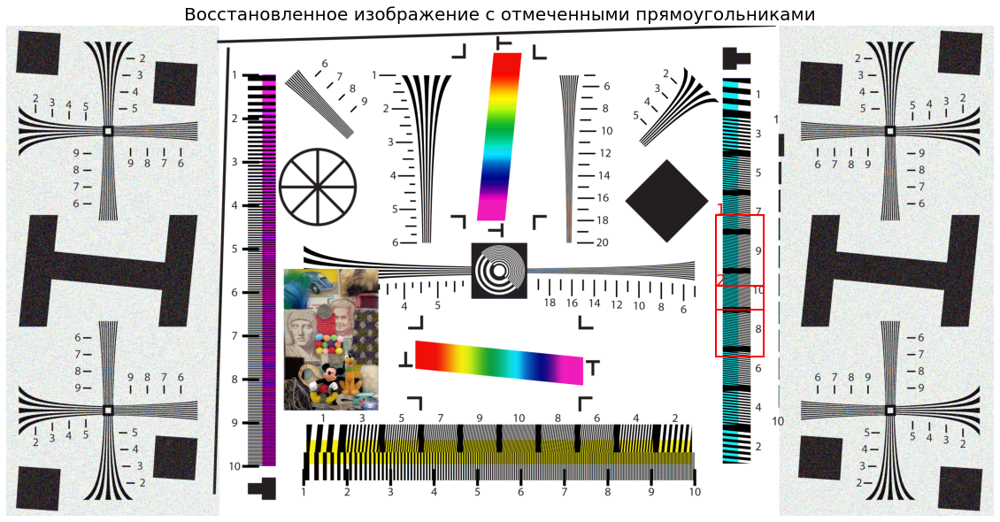

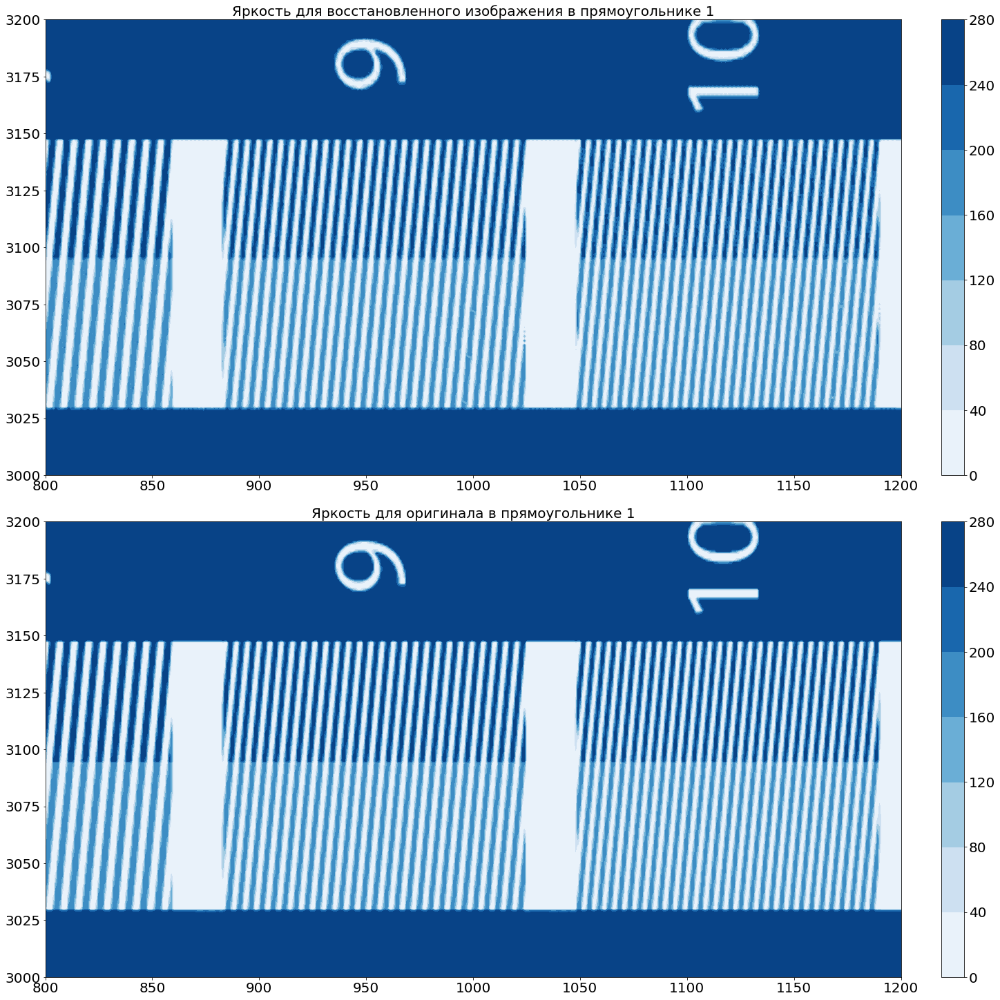

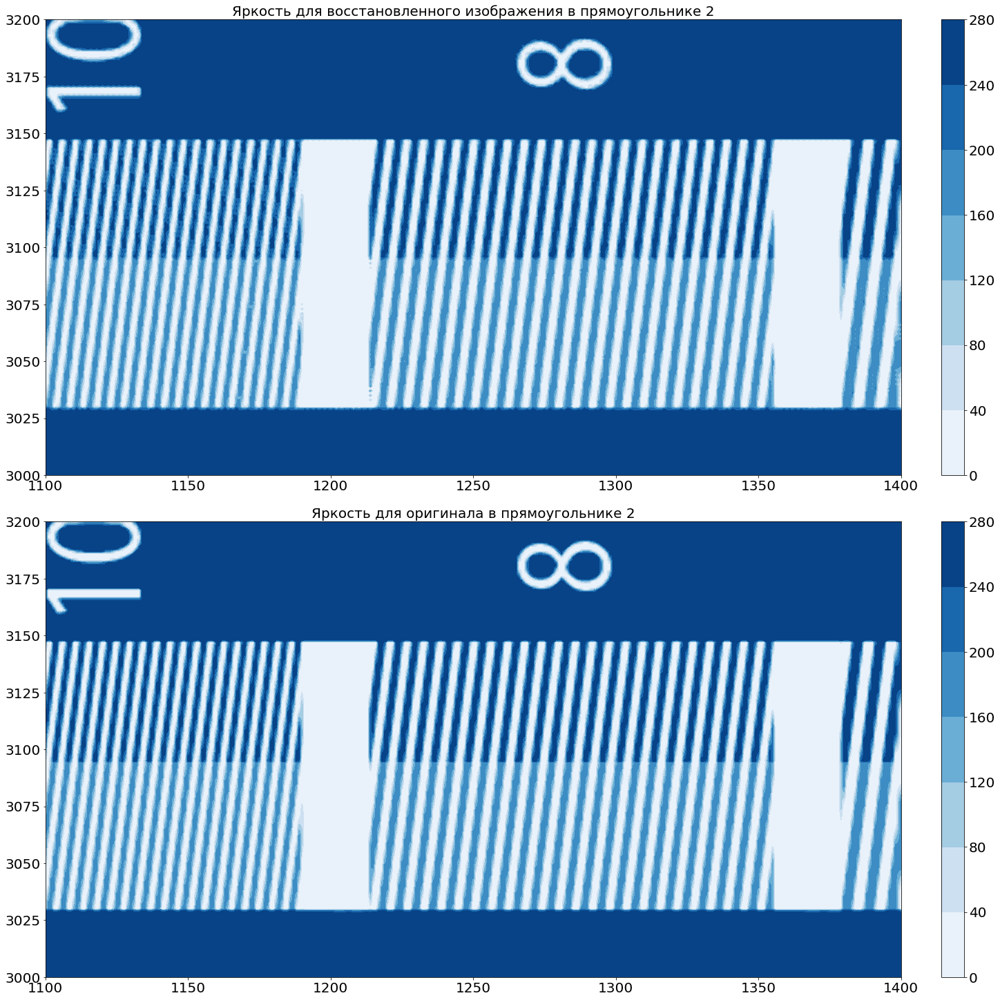

In [70]:
plot_lumience(top_y = [800, 1100], 
              bottom_y = [1200, 1400], 
              left_x = [3000, 3000], 
              right_x = [3200, 3200])


Как ни странно, косые полосы выглядят вполне аккуратно. Даже те, что на голубом фоне вполне различимы. Поэтому этот график никак не повлияет на разрешение.

Осталась нижняя линейка

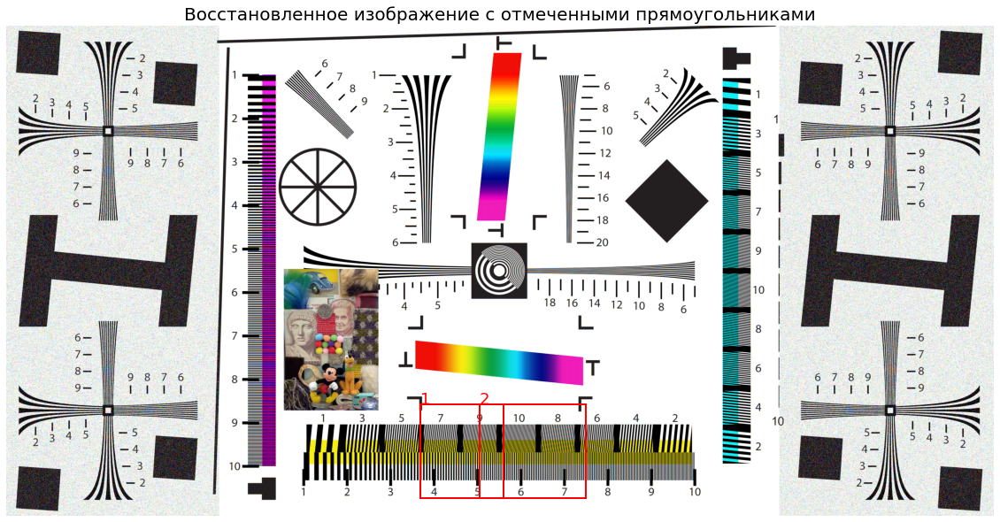

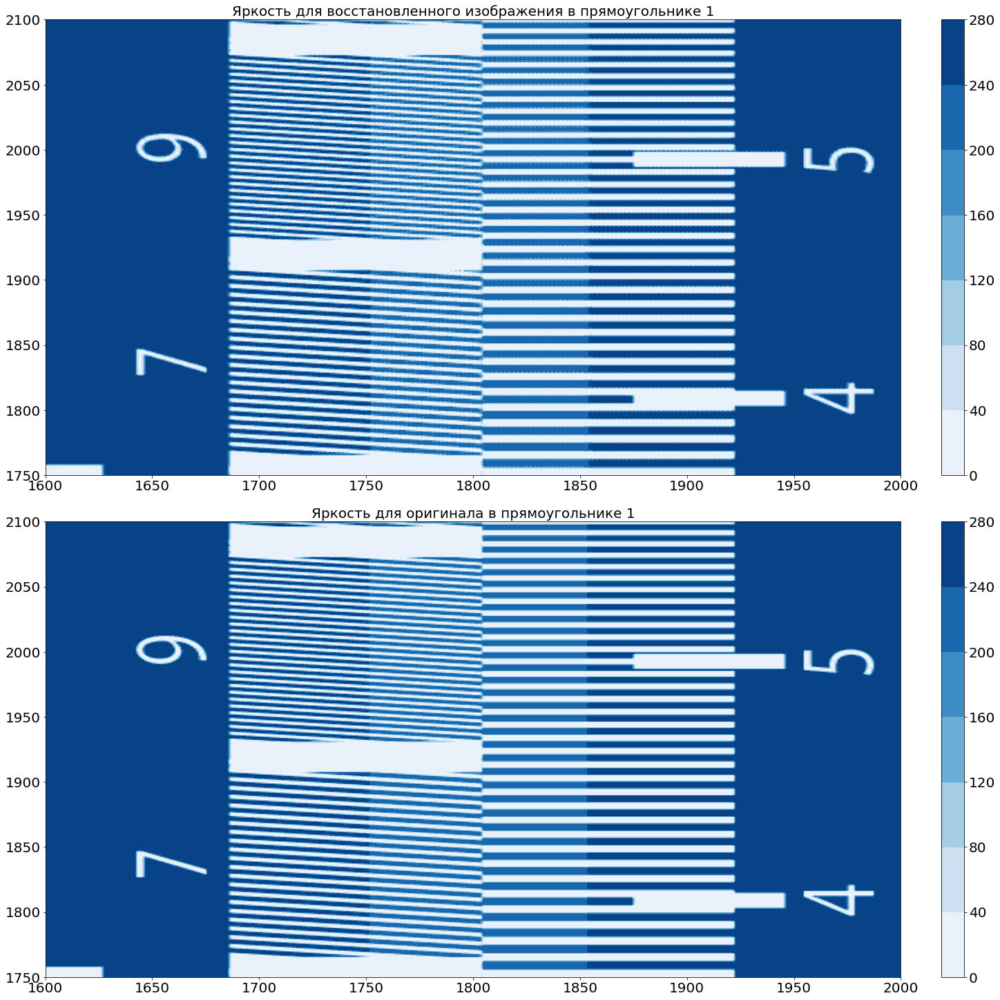

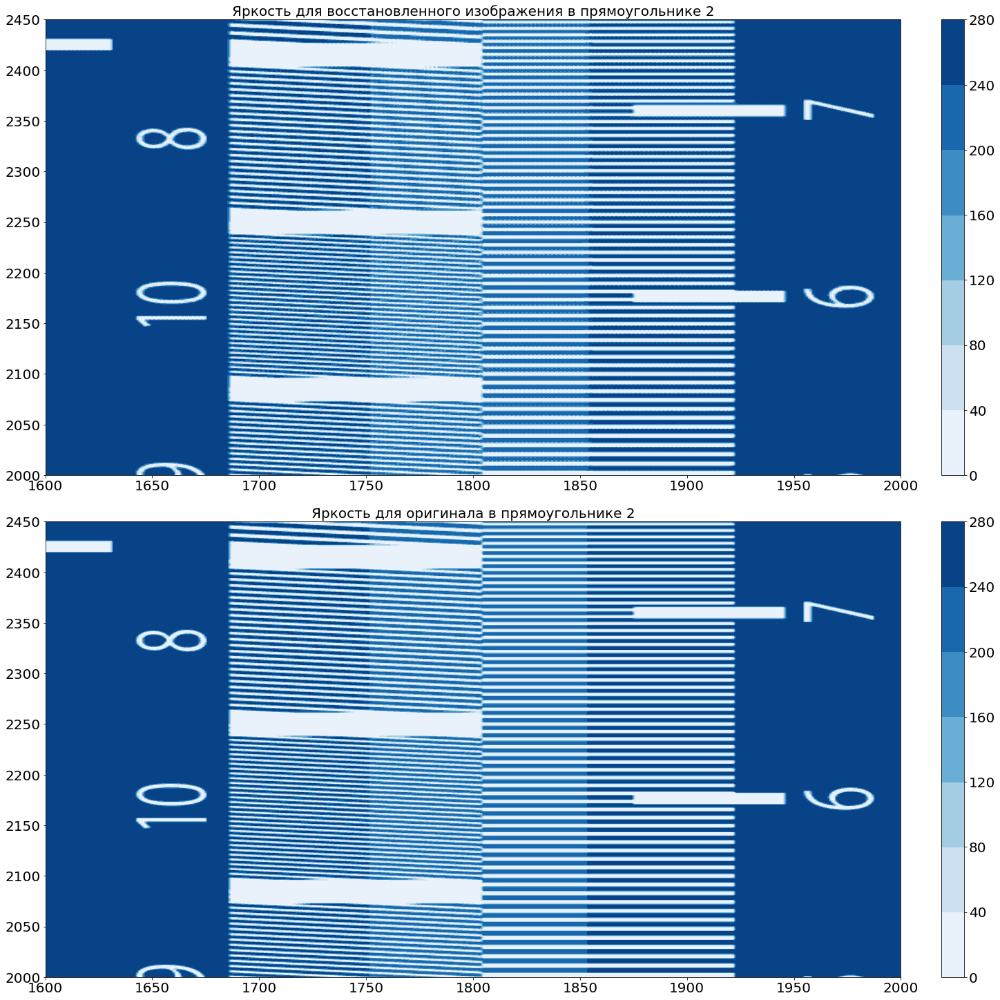

In [77]:
plot_lumience(top_y = [1600, 1600], 
              bottom_y = [2000, 2000], 
              left_x = [1750, 2000], 
              right_x = [2100, 2450])

На это в принципе достаточно тяжело смотреть, но мне кажется что часть с отметкой 10 для восстановленного изображения рябит несколько больше.

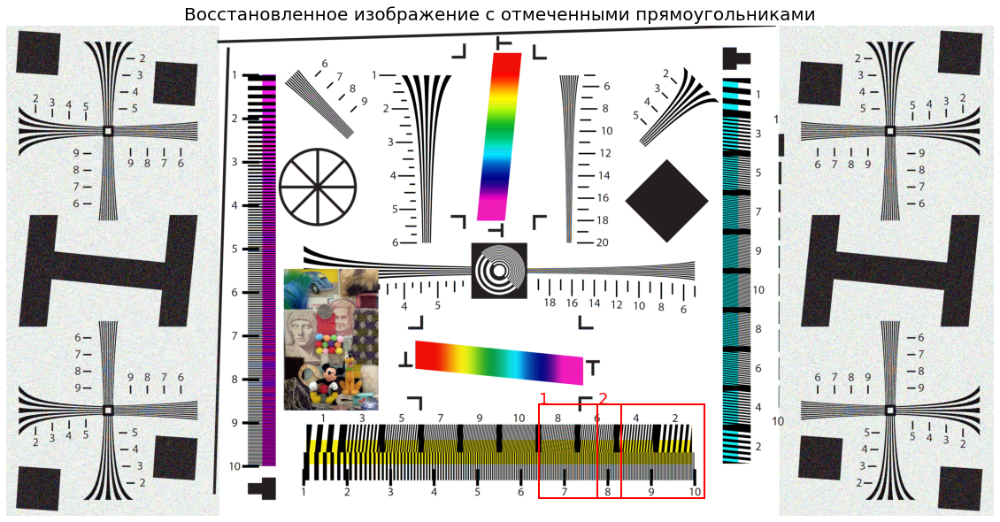

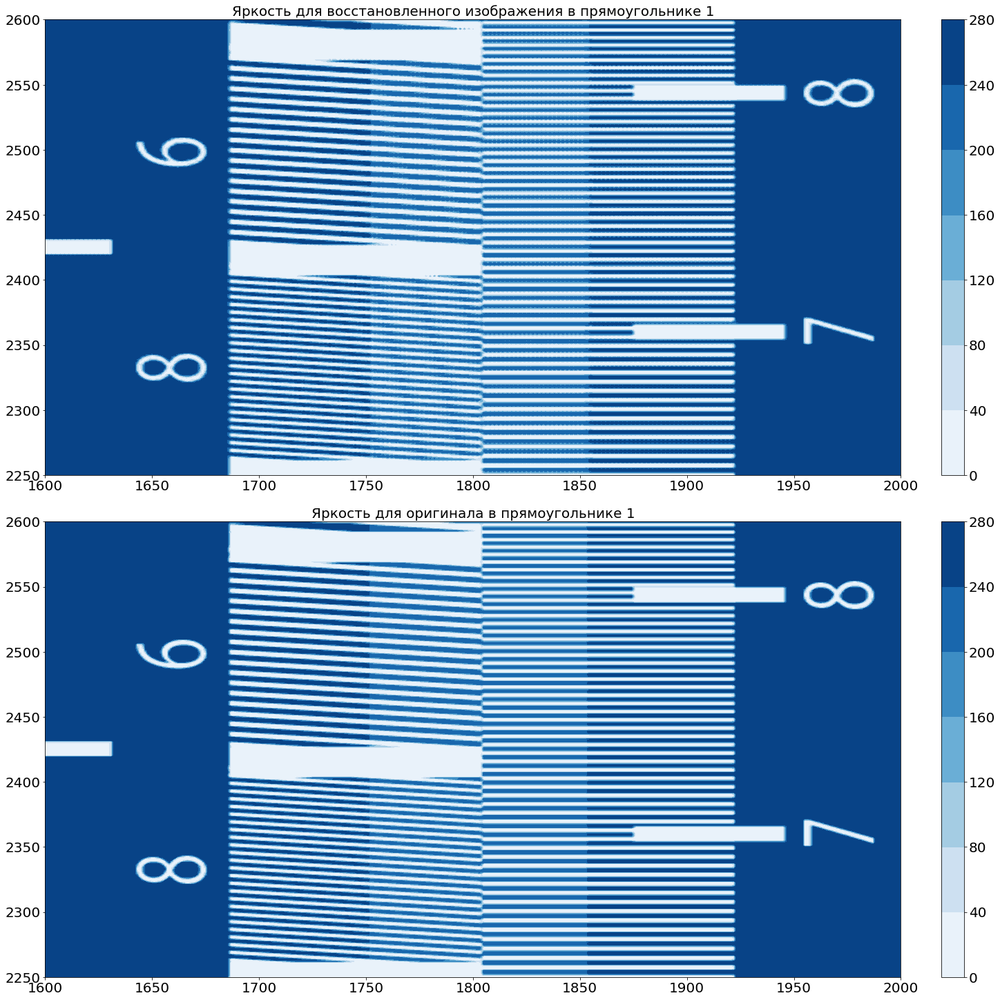

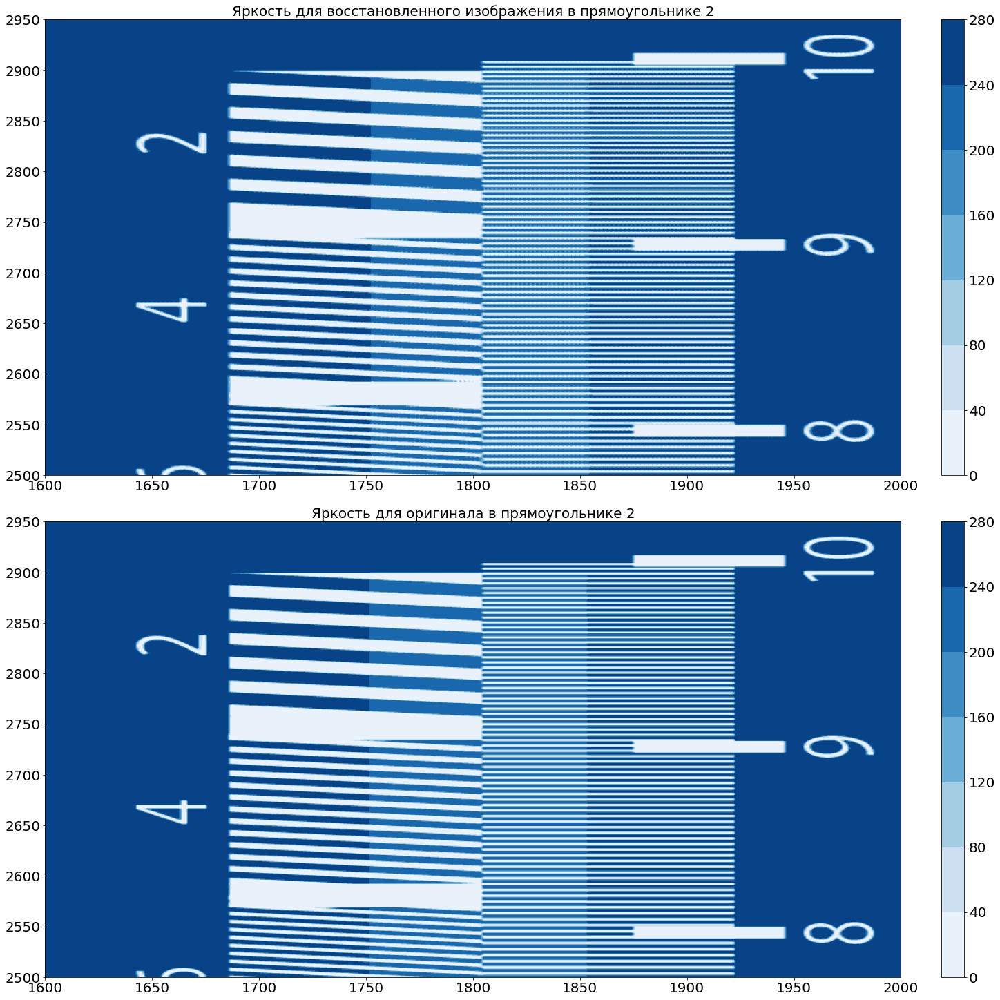

In [78]:
plot_lumience(top_y = [1600, 1600], 
              bottom_y = [2000, 2000], 
              left_x = [2250, 2500], 
              right_x = [2600, 2950])

Картина примерно та же: с оригиналом всё в порядке, а восстановленное изображение начинает рябить на отметке 10.

**Выводы:**

Алгоритм работает и достаточно быстро. Среднее время около 0.23 секунд на мегапиксель.

На тестовом изображении RGB_CFA.bmp удалось получить

* время работы около 0.11 секунд на мегапиксель

* $PSN \approx 24.92$

Предельное разрешение восстановленного изображения из всех рассмотренных частей тестового изображения я оцениваю в 950, предельное разрешения оригинала, я оцениваю в 1500. Получаем, что разрешение снизилось в $\approx 0.63$ раза. 